In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.2 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [4]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [6]:
results = search_images_ddg('diffenbachia')
ims = results.attrgot('contentUrl')
len(ims)

150

In [7]:
dest = 'images/diffenbachia.jpg'

In [8]:
download_url(ims[0], dest)

Path('images/diffenbachia.jpg')

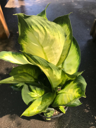

In [9]:
im = Image.open(dest)
im.to_thumb(128,128)

In [10]:
plant_types = 'diffenbachia', 'monstera', 'spider'
path = Path('plants')

In [12]:
if not path.exists():
    path.mkdir()
    for o in plant_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} plant')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [13]:
fns = get_image_files(path)
fns

(#370) [Path('plants/diffenbachia/4fa6b957-aff5-48f6-9a9b-809ac8d01d9f.jpg'),Path('plants/diffenbachia/53acaba9-c89a-4c1b-9d8b-71b20937fbc6.jpg'),Path('plants/diffenbachia/4160d13a-0568-46b4-b6e8-22a01ba4f56e.jpg'),Path('plants/diffenbachia/29d24cfd-7a7e-4581-884d-e2f3f56391dc.jpg'),Path('plants/diffenbachia/e82d4ae4-66c9-4627-8dd3-f24a12ec99c7.jpeg'),Path('plants/diffenbachia/2994f3d9-a664-44e7-8667-8e71c5a154fc.jpg'),Path('plants/diffenbachia/b39bc830-b2f5-4778-87dc-2a8efe8b341f.jpg'),Path('plants/diffenbachia/02ece7bb-547e-4585-882b-13b6f6a74996.jpg'),Path('plants/diffenbachia/7f4c5c16-e60c-4711-b7eb-a6a11d35b148.jpg'),Path('plants/diffenbachia/5f16fae6-a4f3-4a6a-9e8f-1e8faabf8d22.jpg')...]

In [15]:
failed = verify_images(fns)
failed

(#15) [Path('plants/diffenbachia/bfaf2bc1-23e1-48d3-aa56-84113004f437.jpg'),Path('plants/diffenbachia/0ed5199e-2e9b-48ce-87b1-de8983a0b6f3.png'),Path('plants/diffenbachia/3c7aa8eb-a22d-450f-b353-fa7f762a2603.jpg'),Path('plants/diffenbachia/4e0c53a7-223e-477b-a095-278450babfc4.jpg'),Path('plants/spider/e962b00f-d6cb-4c7f-8052-627cdb5f366a.jpg'),Path('plants/spider/2b598c2e-7379-4cde-b717-966884f40db0.jpg'),Path('plants/spider/b2402aa4-ca5a-4bde-9ffe-f7366a565a39.jpg'),Path('plants/spider/df9b72f2-8942-4126-9161-3f2f89c1cc5a.jpg'),Path('plants/spider/4c745781-bd55-4c7c-a7fa-baabf12b183e.jpg'),Path('plants/spider/adafe610-6f71-4e9d-a877-43473fdf88f9.jpg')...]

In [16]:
failed.map(Path.unlink);

In [24]:
plants = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128, ResizeMethod.Squish),
    batch_tfms=aug_transforms(mult=2))

In [25]:
dls = plants.dataloaders(path)

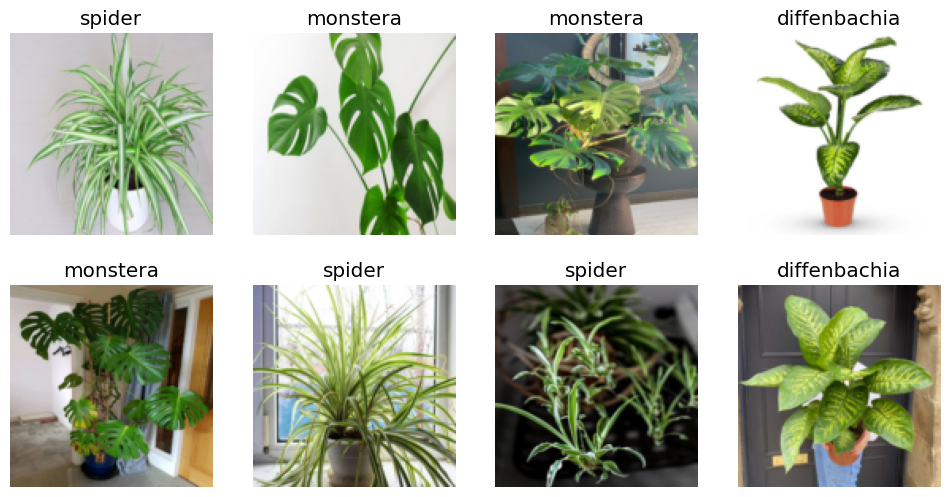

In [26]:
dls.valid.show_batch(max_n=8, nrows=2)

In [27]:
plants = plants.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                    batch_tfms=aug_transforms())

dls = plants.dataloaders(path)

In [28]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 29.1MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.795246,1.495762,0.507042,00:22


epoch,train_loss,valid_loss,error_rate,time
0,0.729959,0.391043,0.126761,00:22
1,0.521585,0.163767,0.042254,00:21
2,0.369708,0.137271,0.042254,00:21
3,0.279928,0.119341,0.042254,00:24


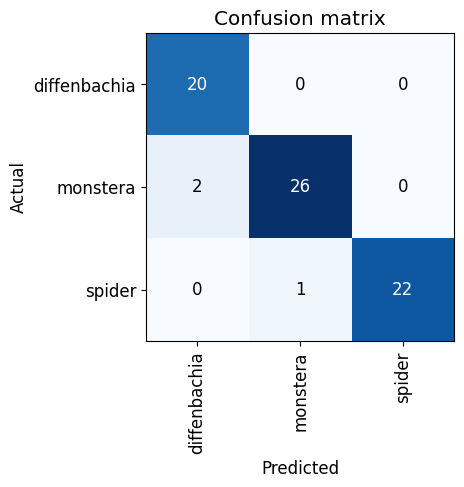

In [29]:

interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

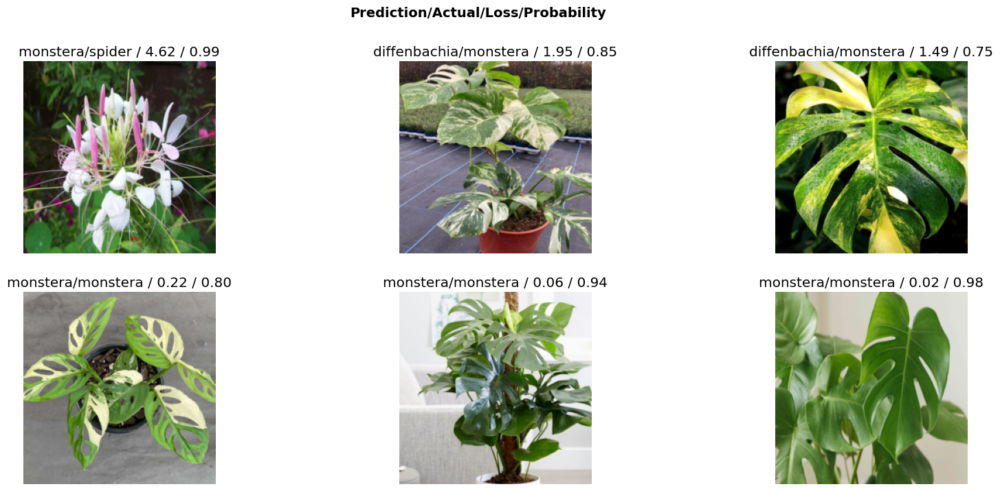

In [35]:
interp.plot_top_losses(6, nrows=2, figsize=(20,8))


In [36]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [38]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [39]:
learn.export()


In [40]:

path = Path()
path.ls(file_exts='.pkl')


(#1) [Path('export.pkl')]

In [41]:
learn_inf = load_learner(path/'export.pkl')


In [42]:
learn_inf.predict('images/diffenbachia.jpg')


('diffenbachia', tensor(0), tensor([9.9974e-01, 2.3098e-04, 3.2432e-05]))

In [43]:
learn_inf.dls.vocab

['diffenbachia', 'monstera', 'spider']

In [44]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [46]:
btn_upload = SimpleNamespace(data = ['images/diffenbachia.jpg'])


In [47]:
img = PILImage.create(btn_upload.data[-1])


In [48]:

#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [49]:
pred,pred_idx,probs = learn_inf.predict(img)


In [50]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: diffenbachia; Probability: 0.9997')

In [51]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [52]:

def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [53]:
btn_upload = widgets.FileUpload()


In [54]:
VBox([widgets.Label('Select your plant!'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [55]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.9/105.9 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.3/380.3 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 9.4 MB/s eta 0:00:00
  Attempting uninstall: pyzmq
    Found existing installation: pyzmq 23.2.1
    Uninstalling pyzmq-23.2.1:
      Successfully uninstalled pyzmq-23.2.1
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting un

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.5.5 OK
